In [1]:
COUNT = 500
TEST = '/kaggle/input/realwaste-data/RealWaste_test/test'
TRAIN = '/kaggle/input/realwaste-data/train/train'

We need image embeddings for both EDA and classification, so let's add some code to get image embeddings from our images using ResNeXt.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 127MB/s]


Let's load up our data. While we are exploring this problem we're going to use a sample of our data that is the same for each class, for performance reasons. This is still going to take a while. If it is morning where you are maybe now is a good time to get a cup of coffee.

In [3]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from PIL import Image

THUMBNAIL_SIZE = (64, 64)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

IGNORE = {
    '/kaggle/input/realwaste-data/train/train/Vegetation/Vegetation_134.jpg',
    '/kaggle/input/realwaste-data/train/train/Vegetation/Vegetation_24.jpg',
}
def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'])
        for index, input_file in enumerate(list(iglob(pathname=arg))) if index < COUNT and input_file not in IGNORE]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*')}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
test_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TEST + '/*')}
test_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in test_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

encoded 500 rows of Metal  in 0:01:50.150052
encoded 336 rows of Glass  in 0:01:14.542201
encoded 400 rows of Paper  in 0:01:25.267602
encoded 348 rows of Vegetation  in 0:01:18.433975
encoded 376 rows of Cardboard  in 0:01:20.059222
encoded 254 rows of Textile Trash  in 0:00:54.292551
encoded 328 rows of Food Organics  in 0:01:11.732103
encoded 500 rows of Plastic  in 0:01:50.009968
encoded 396 rows of Miscellaneous Trash  in 0:01:24.195808
encoded 158 rows of Metal  in 0:00:37.083241
encoded 85 rows of Glass  in 0:00:18.002158
encoded 100 rows of Paper  in 0:00:21.139345
encoded 88 rows of Vegetation  in 0:00:19.551233
encoded 95 rows of Cardboard  in 0:00:21.764148
encoded 64 rows of Textile Trash  in 0:00:14.315819
encoded 83 rows of Food Organics  in 0:00:18.914196
encoded 185 rows of Plastic  in 0:00:41.335990
encoded 99 rows of Miscellaneous Trash  in 0:00:21.498821
done in 0:16:02.994920


The classes in our target variable are not balanced in our training data. How unbalanced are they?

In [4]:
train_df['tag'].value_counts().to_frame().T

tag,Metal,Plastic,Paper,Miscellaneous Trash,Cardboard,Vegetation,Glass,Food Organics,Textile Trash
count,500,500,400,396,376,348,336,328,254


They are not balanced in our test data either.

In [5]:
test_df['tag'].value_counts().to_frame().T

tag,Plastic,Metal,Paper,Miscellaneous Trash,Cardboard,Vegetation,Glass,Food Organics,Textile Trash
count,185,158,100,99,95,88,85,83,64


Let's use TSNE to add x/y coordinates based on our image embeddings. We need to do this twice, once for our training data, and then again for our test data, because we can't fit on one dataset and predict for both.

In [6]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))
test_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
test_df[['x', 'y']] = test_reducer.fit_transform(X=test_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 3438 samples in 0.025s...
[t-SNE] Computed neighbors for 3438 samples in 1.297s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3438
[t-SNE] Computed conditional probabilities for sample 2000 / 3438
[t-SNE] Computed conditional probabilities for sample 3000 / 3438
[t-SNE] Computed conditional probabilities for sample 3438 / 3438
[t-SNE] Mean sigma: 4.437718
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.277451
[t-SNE] KL divergence after 1000 iterations: 1.461799
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 957 samples in 0.008s...
[t-SNE] Computed neighbors for 957 samples in 0.124s...
[t-SNE] Computed conditional probabilities for sample 957 / 957
[t-SNE] Mean sigma: 4.762799
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.694778
[t-SNE] KL divergence after 1000 iterations: 1.100491


Now we are ready to plot. We're going to plot a sample of our training data for performance reasons.

In [7]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']].sample(n=2000, random_state=2025))
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: trash', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? We see some in-class clustering, but our data is kind of messy. Let's build a model and see how it does.

In [8]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score

logreg = LogisticRegression(max_iter=1000, tol=1e-12).fit(train_df['value'].apply(func=pd.Series), train_df['tag'])
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series)))))
print(classification_report(y_true=test_df['tag'], y_pred=logreg.predict(X=test_df['value'].apply(func=pd.Series))))

model fit in 498 iterations
accuracy: 0.8694
f1: 0.8693
                     precision    recall  f1-score   support

          Cardboard       0.82      0.89      0.85        95
      Food Organics       0.92      0.95      0.93        83
              Glass       0.84      0.89      0.86        85
              Metal       0.86      0.87      0.87       158
Miscellaneous Trash       0.79      0.79      0.79        99
              Paper       0.91      0.85      0.88       100
            Plastic       0.87      0.82      0.84       185
      Textile Trash       0.89      0.91      0.90        64
         Vegetation       0.95      0.93      0.94        88

           accuracy                           0.87       957
          macro avg       0.87      0.88      0.87       957
       weighted avg       0.87      0.87      0.87       957



Let's have a look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

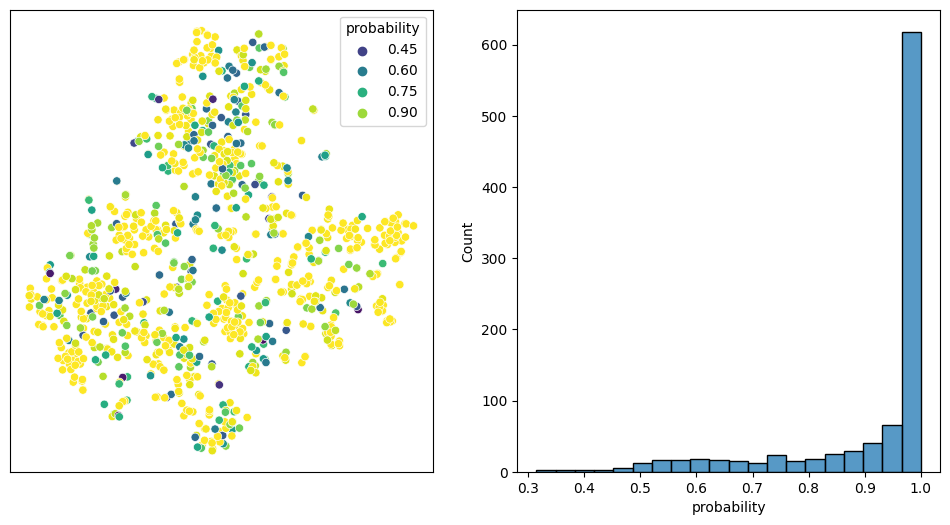

In [9]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')

plot_df = test_df[['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=test_df['value'].apply(func=pd.Series)), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis')
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

We are looking at the model probabilities for all of the test data, and it is not surprising that our higher model probabilities correspond to our TSNE clusters and our lower model probabilities lie on the edges of clusters and between them.